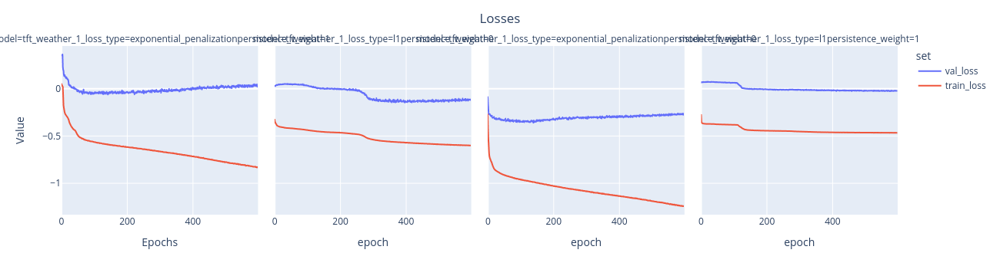

In [1]:
import plotly.express as px
import pandas as pd
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_LOSSES.csv')

fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
#fig_losses.update_traces(mode="markers+lines", hovertemplate=None)
#fig_losses.update_layout(hovermode="x unified")
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

In [2]:
tot_losses

,Unnamed: 0,epoch,set,loss,model
0,0,0,val_loss,0.351586,tft_weather_1_loss_type=exponential_penalizati...
1,1,1,val_loss,0.352342,tft_weather_1_loss_type=exponential_penalizati...
2,2,2,val_loss,0.359637,tft_weather_1_loss_type=exponential_penalizati...
3,3,3,val_loss,0.362736,tft_weather_1_loss_type=exponential_penalizati...
4,4,4,val_loss,0.227302,tft_weather_1_loss_type=exponential_penalizati...
...,...,...,...,...,...
4787,4787,594,train_loss,-0.465827,tft_weather_1_loss_type=l1persistence_weight=1
4788,4788,595,train_loss,-0.465754,tft_weather_1_loss_type=l1persistence_weight=1
4789,4789,596,train_loss,-0.465572,tft_weather_1_loss_type=l1persistence_weight=1
4790,4790,597,train_loss,-0.465806,tft_weather_1_loss_type=l1persistence_weight=1


In [3]:
import plotly.express as px
import pandas as pd
import numpy as np
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_LOSSES.csv')

for c in tot_losses.model.unique():
    if 'linear' in c:
        fig_losses = px.line(tot_losses[tot_losses.model==c],x = 'epoch',y='loss',color = 'set')
        fig_losses.update_layout(title = {'text':f'Losses '+c, 'x':0.5},
                      xaxis_title={'text':'Epochs'},
                      yaxis_title={'text':'Value'},

                        )
        fig_losses.show()

In [4]:
import plotly.express as px
import pandas as pd
import numpy as np
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)
#tot_pred.y_median[tot_pred.model=='d3vae_weather_1'] = tot_pred.y_pred[tot_pred.model=='d3vae_weather_1']
#tot_pred.y_median[tot_pred.model=='persistent_weather_1'] = tot_pred.y_pred[tot_pred.model=='persistent_weather_1']

In [5]:
tot_pred

,Unnamed: 0,lag,time,y,y_pred,prediction_time,model
0,0,1,2020-10-20 06:00:00,0.414501,0.641428,2020-10-20 05:50:00,tft_weather_1_loss_type=exponential_penalizati...
1999296,1999296,1,2020-10-20 06:00:00,0.414501,0.665504,2020-10-20 05:50:00,tft_weather_1_loss_type=l1persistence_weight=1
1332864,1332864,1,2020-10-20 06:00:00,0.414501,0.503456,2020-10-20 05:50:00,tft_weather_1_loss_type=exponential_penalizati...
666432,666432,1,2020-10-20 06:00:00,0.414501,1.560470,2020-10-20 05:50:00,tft_weather_1_loss_type=l1persistence_weight=0
2009709,2009709,2,2020-10-20 06:10:00,0.294546,0.660783,2020-10-20 05:50:00,tft_weather_1_loss_type=l1persistence_weight=1
...,...,...,...,...,...,...,...
1999294,1999294,64,2020-12-31 23:40:00,0.606429,-0.192301,2020-12-31 13:00:00,tft_weather_1_loss_type=exponential_penalizati...
1332863,1332863,64,2020-12-31 23:50:00,0.528458,-0.162683,2020-12-31 13:10:00,tft_weather_1_loss_type=l1persistence_weight=0
666431,666431,64,2020-12-31 23:50:00,0.528458,-0.140376,2020-12-31 13:10:00,tft_weather_1_loss_type=exponential_penalizati...
1999295,1999295,64,2020-12-31 23:50:00,0.528458,-0.206630,2020-12-31 13:10:00,tft_weather_1_loss_type=exponential_penalizati...


In [6]:
try:
    tot_pred.y_pred[pd.isnull(tot_pred.y_pred)] = tot_pred.y_median[pd.isnull(tot_pred.y_pred)] 
except:
    tot_pred['y_pred'] = tot_pred.y_median.values

AttributeError: 'DataFrame' object has no attribute 'y_median'

In [6]:
tot_pred.lag.max()

64

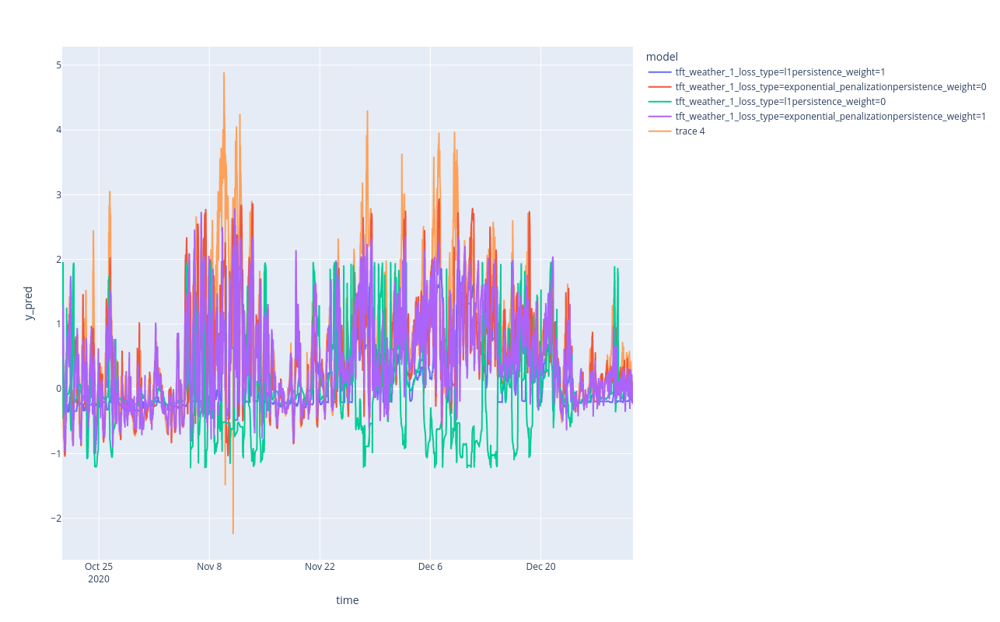

In [9]:
lag=17
fig = px.line(tot_pred[(tot_pred.lag==lag)], x='time', y='y_pred', color='model',height=800)
fig.add_scatter(x = tot_pred[(tot_pred.lag==lag) & (tot_pred.model==tot_pred.model.unique()[0])].time, y=tot_pred[(tot_pred.lag==lag) & (tot_pred.model==tot_pred.model.unique()[0])].y)
fig.show() #150--400

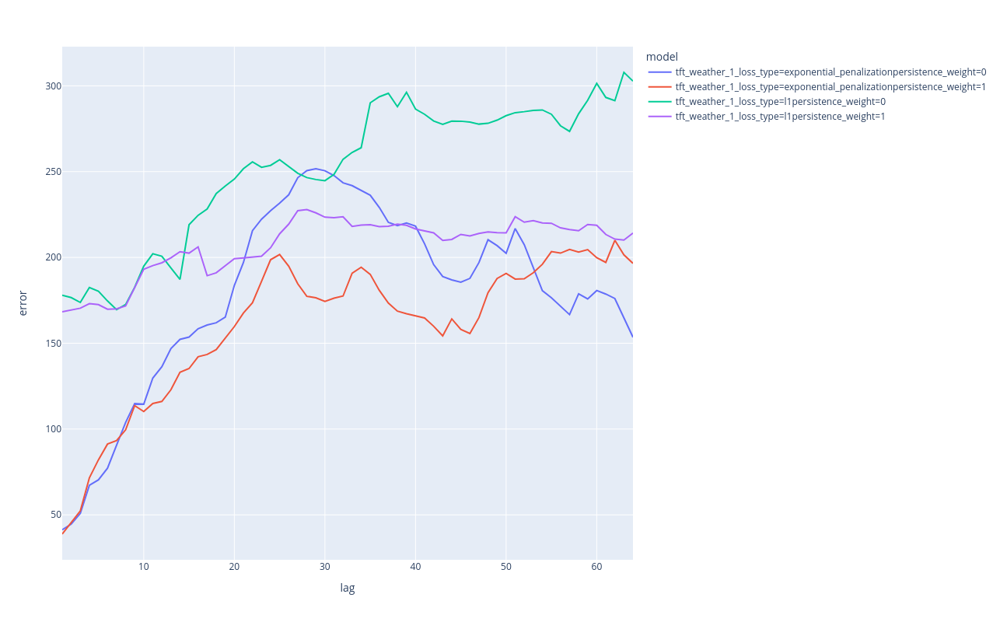

In [10]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_pred)/x.y)).reset_index().rename(columns={0:'error'}) 
import numpy as np
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show() #150--400

In [9]:
tot_pred = tot_pred.reset_index().drop(columns = ['index','Unnamed: 0'])

In [10]:
tot_pred.model.unique()

array(['tft_weather_1_loss_type=exponential_penalizationpersistence_weight=5',
       'tft_weather_1_loss_type=msepersistence_weight=5',
       'patchtst_weather_1_loss_type=exponential_penalizationpersistence_weight=1',
       'tft_weather_1_loss_type=msepersistence_weight=0',
       'tft_weather_1_loss_type=msepersistence_weight=1',
       'tft_weather_1_loss_type=exponential_penalizationpersistence_weight=1',
       'tft_weather_1_loss_type=exponential_penalizationpersistence_weight=0',
       'linear_d_1_loss_type=exponential_penalizationpersistence_weight=0',
       'dilated_conv_vae_test_1_use_cumsum=Falseloss_type=mdapersistence_weight=1',
       'linear_d_1_loss_type=exponential_penalizationpersistence_weight=5',
       'linear_d_1_loss_type=exponential_penalizationpersistence_weight=1',
       'linear_d_1_loss_type=msepersistence_weight=1',
       'dilated_conv_vae_test_1_use_cumsum=Falseloss_type=mdapersistence_weight=0',
       'dilated_conv_vae_test_1_use_cumsum=Trueloss_ty

In [11]:
persistence = tot_pred[(tot_pred.model==tot_pred.model.unique()[0]) & (tot_pred.lag==1) ].drop_duplicates()
persistence = persistence[['prediction_time','y_pred']].rename(columns={'y_pred':'y_prec'}).reset_index()[['prediction_time','y_prec']]


In [12]:
persistence

,prediction_time,y_prec
0,2020-10-20 05:50:00,0.695512
1,2020-10-20 06:00:00,0.669287
2,2020-10-20 06:10:00,0.631253
3,2020-10-20 06:20:00,0.599373
4,2020-10-20 06:30:00,0.593190
...,...,...
10408,2020-12-31 12:30:00,0.064060
10409,2020-12-31 12:40:00,0.085115
10410,2020-12-31 12:50:00,0.093474
10411,2020-12-31 13:00:00,0.063605


In [13]:
tot_pred_new = pd.merge(tot_pred,persistence,on='prediction_time',how='left')

In [14]:
tot_pred_new = tot_pred_new.sort_values(by=['prediction_time','model','lag'])

In [15]:
tot_pred_new_prec = tot_pred_new[tot_pred_new.model == tot_pred_new.model.values[0]]

In [16]:
tot_pred_new_prec.model = 'persistent'
tot_pred_new_prec.y_pred = tot_pred_new_prec.y_prec
tot_pred_new = pd.concat([tot_pred_new,tot_pred_new_prec],ignore_index=True)

/tmp/ipykernel_45332/1064679427.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_45332/1064679427.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
WEIGHT = 1
def compute(x,alpha=1):

    try:
        prec = x.y_prec[x.lag==1].values[0]
    except:
        return None,None
    #prec = x.y_pred.values.mean()
    error = np.abs(x.y_pred.values-x.y.values)
    scostamento_persistente = np.abs(x.y_pred.values-prec)


    return error.mean(),scostamento_persistente.mean(),(error*(1+WEIGHT*np.exp(-scostamento_persistente))).mean()

def compute_fun(x):
    error, scostamento, tot_error = compute(x)
    return pd.Series({'error':error if error is not None else np.nan, 
                      'error_p':scostamento if scostamento is not None else np.nan,
                      'error_tot':tot_error if tot_error is not None else np.nan})

In [18]:
agg = tot_pred_new.groupby(['prediction_time','model']).apply(compute_fun).reset_index().dropna()


In [28]:
pd.set_option('display.max_colwidth', None)

agg.groupby('model')[['error','error_p','error_tot']].mean().reset_index().sort_values(by='error_p')

,model,error,error_p,error_tot
17,persistent,0.521985,0.000000,1.043970
11,patchtst_weather_1_loss_type=exponential_penalizationpersistence_weight=0,0.584461,0.474990,0.925005
16,patchtst_weather_1_loss_type=msepersistence_weight=5,0.593144,0.490163,0.938181
14,patchtst_weather_1_loss_type=msepersistence_weight=0,0.593144,0.490163,0.938181
1,dilated_conv_vae_test_1_use_cumsum=Falseloss_type=mdapersistence_weight=1,0.366128,0.493577,0.587108
2,dilated_conv_vae_test_1_use_cumsum=True,0.552032,0.498752,0.865850
15,patchtst_weather_1_loss_type=msepersistence_weight=1,0.601187,0.499569,0.946612
6,linear_d_1_loss_type=exponential_penalizationpersistence_weight=1,0.574307,0.502473,0.880908
3,dilated_conv_vae_test_1_use_cumsum=Trueloss_type=mdapersistence_weight=0,0.334450,0.524973,0.527273
21,tft_weather_1_loss_type=msepersistence_weight=0,0.649813,0.533956,0.988154


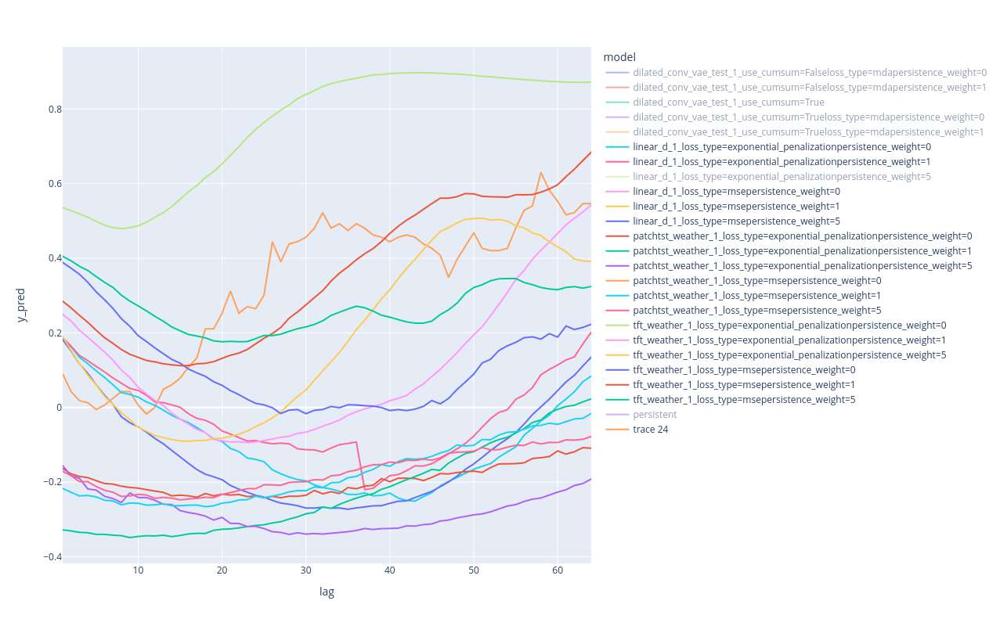

In [21]:
#27-11-2020
date  ='2020-12-19 13:20:00'
subset = tot_pred_new[(tot_pred_new.prediction_time==date)]
fig = px.line(subset, x='lag', y='y_pred', color='model',height=800)
fig.add_scatter(x = subset.lag[subset.model==subset.model.unique()[0]], y=subset.y[subset.model==subset.model.unique()[0]])

fig.show()

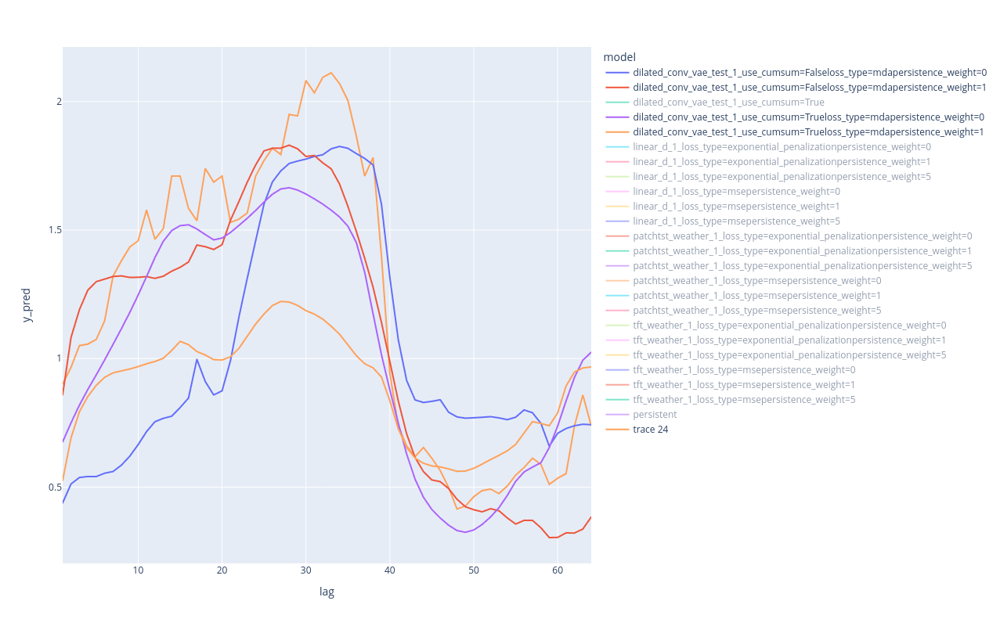

In [22]:
date  ='2020-12-08 05:30:00'
subset = tot_pred_new[(tot_pred_new.prediction_time==date)]
fig = px.line(subset, x='lag', y='y_pred', color='model',height=800)
fig.add_scatter(x = subset.lag[subset.model==subset.model.unique()[0]], y=subset.y[subset.model==subset.model.unique()[0]])

fig.show()

In [ ]:
import plotly.express as px
import pandas as pd
import numpy as np
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/weather_paper/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)




KeyboardInterrupt



In [ ]:
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_pred)/x.y)).reset_index().rename(columns={0:'error'}) 
fig = px.line(error, x='lag', y='error', color='model',height=600,width=1000)
fig.update_layout(legend=dict(x=0.65,y=.1),font=dict(size=16)) 
fig.write_image('error.pdf')

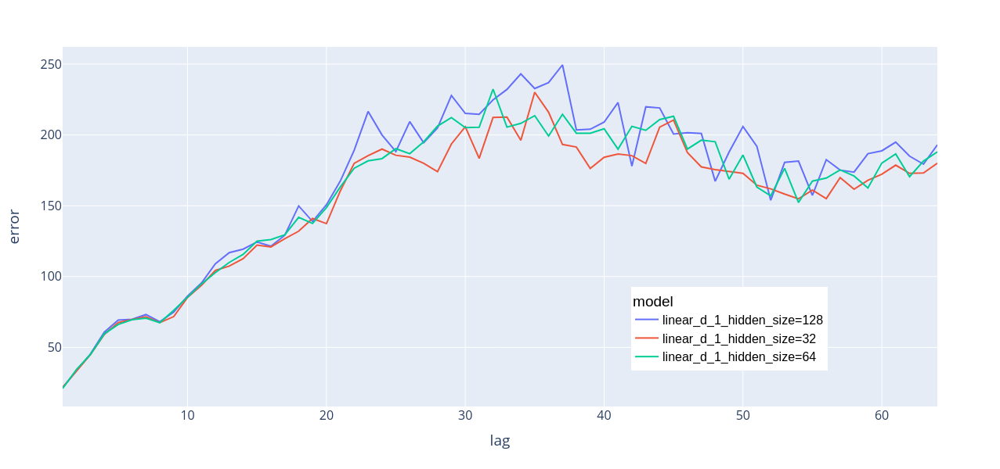